In [87]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
import plotly.express as px
plt.style.use('fivethirtyeight')#theme for the plot area

In [88]:
# connecting to the datasource
df = pd.read_csv('dataset/bakery_sales.csv', index_col = 0)
df.head(10)

,date,time,ticket_number,article,Quantity,unit_price
0,2021-01-02,08:38,150040.0,BAGUETTE,1.0,"0,90 €"
1,2021-01-02,08:38,150040.0,PAIN AU CHOCOLAT,3.0,"1,20 €"
4,2021-01-02,09:14,150041.0,PAIN AU CHOCOLAT,2.0,"1,20 €"
5,2021-01-02,09:14,150041.0,PAIN,1.0,"1,15 €"
8,2021-01-02,09:25,150042.0,TRADITIONAL BAGUETTE,5.0,"1,20 €"
11,2021-01-02,09:25,150043.0,BAGUETTE,2.0,"0,90 €"
12,2021-01-02,09:25,150043.0,CROISSANT,3.0,"1,10 €"
15,2021-01-02,09:27,150044.0,BANETTE,1.0,"1,05 €"
18,2021-01-02,09:32,150045.0,TRADITIONAL BAGUETTE,3.0,"1,20 €"
19,2021-01-02,09:32,150045.0,CROISSANT,6.0,"1,10 €"


In [89]:
print(df.shape)#checking the structure of our data(total rows and columns)

(234005, 6)


In [90]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 234005 entries, 0 to 511395
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   date           234005 non-null  object 
 1   time           234005 non-null  object 
 2   ticket_number  234005 non-null  float64
 3   article        234005 non-null  object 
 4   Quantity       234005 non-null  float64
 5   unit_price     234005 non-null  object 
dtypes: float64(2), object(4)
memory usage: 12.5+ MB
None


data cleaning processes. removing blanks, duplicates, null values etc

In [91]:
# find missing values
print(df.isna().sum())

date             0
time             0
ticket_number    0
article          0
Quantity         0
unit_price       0
dtype: int64


In [92]:
# find duplicated data
df.duplicated().sum()

np.int64(1210)

In [93]:
# remove the duplicated values
df= df.drop_duplicates()
df.shape

(232795, 6)

In [94]:
# rename the columns to have more meaningful names
df = df.rename(columns = {'date': 'Date',
                          'time':'Time',
                          'ticket_number':'Transaction_id',
                          'article':'Menu',
                          'unit_price':'Price'})

# convert the Menu value to title case
df['Menu'] =df['Menu'].str.title()

# remove the . in quantity and fix the Price
df = df.replace(to_replace = {'Quantity' : {'.': ''},
                              'Price' : {'€' : '', ',':'.'}}, regex=True)

# change the datatype of the Quantity, Price, Menu and Transaction_id
df = df.astype({'Quantity': 'int',
                'Price' : 'float',
                'Transaction_id' : 'int',
                'Menu' : 'str'})

In [95]:
# create a Revenue Column to find the bakery's income
df['Revenue'] = df['Quantity']*df['Price']

In [96]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 232795 entries, 0 to 511395
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Date            232795 non-null  object 
 1   Time            232795 non-null  object 
 2   Transaction_id  232795 non-null  int64  
 3   Menu            232795 non-null  object 
 4   Quantity        232795 non-null  int64  
 5   Price           232795 non-null  float64
 6   Revenue         232795 non-null  float64
dtypes: float64(2), int64(2), object(3)
memory usage: 14.2+ MB
None


In [97]:
df.head()

,Date,Time,Transaction_id,Menu,Quantity,Price,Revenue
0,2021-01-02,08:38,150040,Baguette,1,0.90,0.90
1,2021-01-02,08:38,150040,Pain Au Chocolat,3,1.20,3.60
4,2021-01-02,09:14,150041,Pain Au Chocolat,2,1.20,2.40
5,2021-01-02,09:14,150041,Pain,1,1.15,1.15
8,2021-01-02,09:25,150042,Traditional Baguette,5,1.20,6.00


In [98]:
# convert  the date to Datetime datatype
df['Date'] = pd.to_datetime(df['Date'])

In [99]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 232795 entries, 0 to 511395
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Date            232795 non-null  datetime64[ns]
 1   Time            232795 non-null  object        
 2   Transaction_id  232795 non-null  int64         
 3   Menu            232795 non-null  object        
 4   Quantity        232795 non-null  int64         
 5   Price           232795 non-null  float64       
 6   Revenue         232795 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(2)
memory usage: 14.2+ MB
None


In [100]:
# breakdown the date column into weekday, day, month, Quater and year
df['Weekday'] = df['Date'].dt.weekday
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.to_period('M')
df['Year'] = df['Date'].dt.year
df['Quarter'] = df['Date'].dt.to_period('Q')

# turn the "Weekday" column int name of the week
df = df.replace(to_replace = {
    'Weekday' : {
        0 : 'Monday',
        1 : 'Tuesday',
        2 : 'Wednesday',
        3 : 'Thursday',
        4 : 'Friday',
        5 : 'Saturday',
        6 : 'Sunday'
    }}, regex = True)

#  breakdown "Time" column into day time(Morning, mid_day, evening)
df['Day_time'] = pd.to_datetime(df['Time']).dt.hour

#  create a function from hour to daytime
def day_time(Day_time):
    if Day_time < 12:
        return 'Morning'
    elif Day_time < 16:
        return 'Mid_Day'
    else:
        return 'Evening'

# Apply these to the new column
df['Day_time'] = df.Day_time.apply(day_time)
df.head(3)

C:\Users\user\AppData\Local\Temp\ipykernel_14124\3785551045.py:21: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



,Date,Time,Transaction_id,Menu,Quantity,Price,Revenue,Weekday,Day,Month,Year,Quarter,Day_time
0,2021-01-02,08:38,150040,Baguette,1,0.9,0.9,Saturday,2,2021-01,2021,2021Q1,Morning
1,2021-01-02,08:38,150040,Pain Au Chocolat,3,1.2,3.6,Saturday,2,2021-01,2021,2021Q1,Morning
4,2021-01-02,09:14,150041,Pain Au Chocolat,2,1.2,2.4,Saturday,2,2021-01,2021,2021Q1,Morning


In [101]:
# Sort the data to view from the smallest to the largest
df.sort_values(by=['Menu', 'Quantity', 'Price', 'Revenue'])

,Date,Time,Transaction_id,Menu,Quantity,Price,Revenue,Weekday,Day,Month,Year,Quarter,Day_time
43541,2021-03-18,12:59,161853,.,1,0.0,0.0,Thursday,18,2021-03,2021,2021Q1,Mid_Day
54650,2021-04-04,09:53,164878,.,1,0.0,0.0,Sunday,4,2021-04,2021,2021Q2,Morning
73667,2021-04-27,16:48,170079,.,1,0.0,0.0,Tuesday,27,2021-04,2021,2021Q2,Evening
33726,2021-03-04,12:32,159219,.,2,0.0,0.0,Thursday,4,2021-03,2021,2021Q1,Mid_Day
135091,2021-07-10,13:25,186662,.,2,0.0,0.0,Saturday,10,2021-07,2021,2021Q3,Mid_Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501877,2022-09-17,07:33,286289,Vik Bread,5,2.7,13.5,Saturday,17,2022-09,2022,2022Q3,Morning
510827,2022-09-30,09:55,288758,Vik Bread,5,2.7,13.5,Friday,30,2022-09,2022,2022Q3,Morning
139768,2021-07-14,08:51,187882,Vik Bread,6,2.5,15.0,Wednesday,14,2021-07,2021,2021Q3,Morning
116514,2021-06-19,18:28,181621,Vik Bread,10,2.5,25.0,Saturday,19,2021-06,2021,2021Q2,Evening


In [102]:
df = df[~df['Menu'].isin(['.'])].reset_index(drop = True)
df = df[~df['Price'].isin([0])].reset_index(drop = True)
df.sort_values(by=['Menu', 'Quantity', 'Price', 'Revenue'])

,Date,Time,Transaction_id,Menu,Quantity,Price,Revenue,Weekday,Day,Month,Year,Quarter,Day_time
191546,2022-07-13,12:32,264526,12 Macaron,1,10.0,10.0,Wednesday,13,2022-07,2022,2022Q3,Mid_Day
193816,2022-07-16,13:06,265779,12 Macaron,1,10.0,10.0,Saturday,16,2022-07,2022,2022Q3,Mid_Day
194448,2022-07-17,10:25,266077,12 Macaron,1,10.0,10.0,Sunday,17,2022-07,2022,2022Q3,Morning
194722,2022-07-17,11:49,266223,12 Macaron,1,10.0,10.0,Sunday,17,2022-07,2022,2022Q3,Morning
194834,2022-07-17,12:48,266300,12 Macaron,1,10.0,10.0,Sunday,17,2022-07,2022,2022Q3,Mid_Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...
228510,2022-09-17,07:33,286289,Vik Bread,5,2.7,13.5,Saturday,17,2022-09,2022,2022Q3,Morning
232505,2022-09-30,09:55,288758,Vik Bread,5,2.7,13.5,Friday,30,2022-09,2022,2022Q3,Morning
63695,2021-07-14,08:51,187882,Vik Bread,6,2.5,15.0,Wednesday,14,2021-07,2021,2021Q3,Morning
53041,2021-06-19,18:28,181621,Vik Bread,10,2.5,25.0,Saturday,19,2021-06,2021,2021Q2,Evening


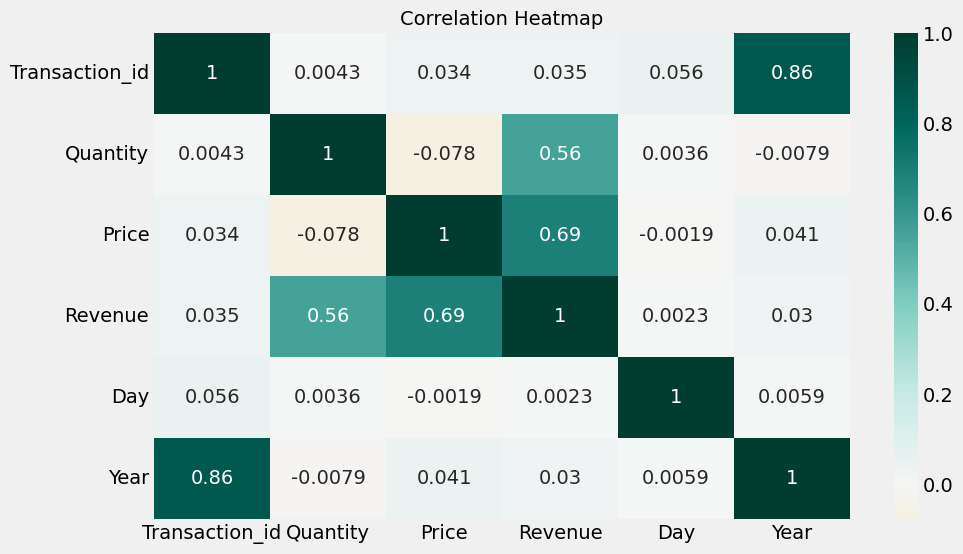

In [103]:
plt.figure(figsize = (10,6))
heatmap = sns.heatmap(df.corr(numeric_only = True), annot = True, cmap = 'BrBG', center = 0)
heatmap.set_title('Correlation Heatmap', fontdict = {'fontsize': 14})
plt.show()

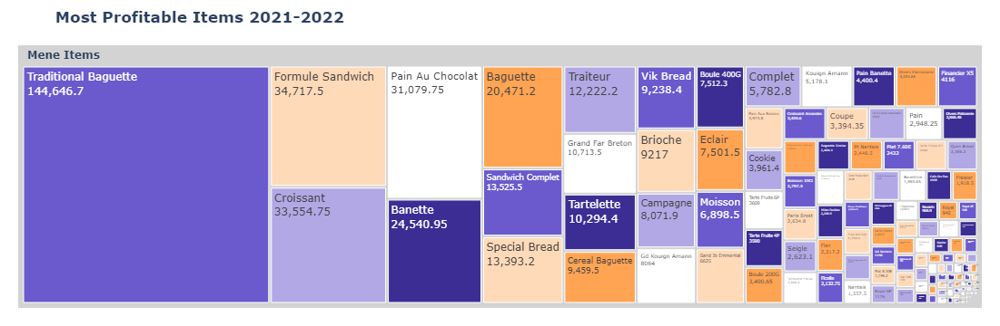

In [104]:
# Most profitable Items
fig = px.treemap(data_frame = df,
                path = [px.Constant('<b> Mene Items'), 'Menu'],
                 title = '<b> Most Profitable Items 2021-2022',
                 values = 'Revenue')
fig.data[0].textinfo = 'label+text+value'
fig.update_traces(root_color = 'lightgrey')
fig.update_layout(treemapcolorway = ['slateblue', 'peachpuff'],
                  margin = dict(t=50, l=20, r=20, b=20))
fig.layout.hovermode = False
fig.show()



In [110]:
# compute average daily sale
ads_2021 = df[(df['Quarter'] >= '2021Q1') & (df['Quarter'] <= '2021Q3')]\
['Revenue'].sum(numeric_only=True)/ df['Date'].nunique()

print('Averange Daily Sales 2021:', '€', '%.2f' %ads_2021)

Averange Daily Sales 2021: € 406.94


In [112]:
ads_2022 = df[(df['Quarter'] >= '2022Q1') & (df['Quarter'] <= '2022Q3')]\
['Revenue'].sum(numeric_only=True)/ df['Date'].nunique()

print('Averange Daily Sales 2021:', '€', '%.2f' %ads_2022)

Averange Daily Sales 2021: € 423.16


Determining the revenue by day of the week. Which of the days had the most sales or was the busiest for the business. The business
The importance of this in determining whicj of the days the business can add more man power for example which day they need to do better.
We use colomn chart or pie char(Revenue, WeekDay columns

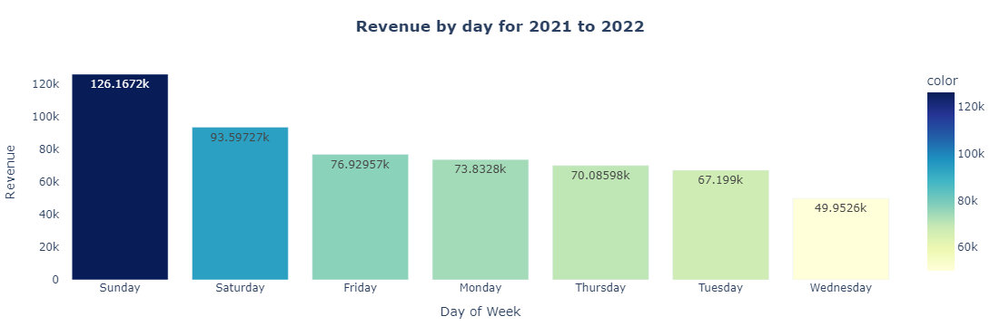

In [134]:
profitable_items = df.groupby('Weekday').sum(numeric_only=True)['Revenue'].sort_values(ascending = False)

fig = px.bar(profitable_items,
             color = profitable_items,
             color_continuous_scale = px.colors.sequential.YlGnBu)

fig.update_layout(margin = dict(t=70, b=10, l=20, r=20),
            title = '<b>Revenue by day for 2021 to 2022', title_x = 0.5,
            xaxis_tickangle = 0,
            yaxis = {'categoryorder' : 'total ascending'},
            plot_bgcolor = 'White')

fig.update_xaxes(title='Day of Week')
fig.update_yaxes(showticklabels = True,
                title = 'Revenue')
fig.update_traces(texttemplate = '%{y}',
                 textposition = 'inside',
                 hovertemplate = '<b>%{x} </b><b>Revenue: %{y}')

fig.show()

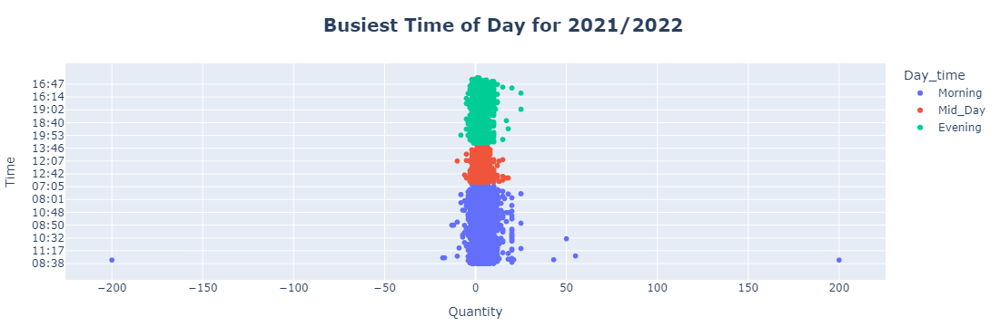

In [137]:
fig = px.scatter(df, x='Quantity', y='Time', color='Day_time')
fig.update_layout(margin = dict(t=70, b=10, l=20, r=20),
                 title = '<b> Busiest Time of Day for 2021/2022', title_x = 0.5,
                 titlefont = dict(size=20))

Calculate the Quartely Revenue Growth

C:\Users\user\AppData\Local\Temp\ipykernel_14124\1054781872.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\user\AppData\Local\Temp\ipykernel_14124\1054781872.py:6: UserWarning:


The palette list has fewer values (6) than needed (7) and will cycle, which may produce an uninterpretable plot.



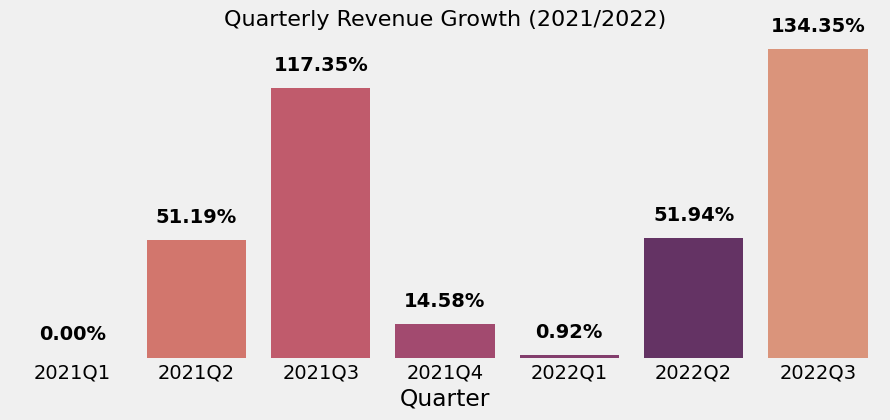

In [141]:
rev_quarter = df.groupby(df['Quarter'])['Revenue'].sum()
rev_growth = (rev_quarter/rev_quarter.iloc[0] - 1) * 100

fig = plt.figure(figsize = (10,4))
color = sns.color_palette('flare')
ax = sns.barplot(data=rev_growth.reset_index(), x='Quarter', y='Revenue', palette = color)

for i in ax.containers:
    ax.bar_label(i, padding=10, color='black', fontsize=14, label_type='edge',
                fontweight = 'bold', fmt='%.2f%%')
    plt.title('Quarterly Revenue Growth (2021/2022)', size = 16)
    ax.spines[['left', 'top', 'bottom']].set_visible(False)
    ax.yaxis.set_visible(False)

plt.show()